# 1. 터미널에서
conda create -n mvtec-patchcore python=3.10
conda activate mvtec-patchcore
# 2. 필요한 패키지 설치
pip install torch torchvision faiss-cpu opencv-python matplotlib seaborn scikit-learn pandas numpy ipykernel
# 3. 커널 등록
python -m ipykernel install --user --name mvtec-patchcore --display-name "Python 3.10 PatchCore"

In [12]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [13]:
import os
import glob
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, precision_recall_curve, auc
import matplotlib.pyplot as plt
import warnings
#warnings.filterwarnings("ignore", category=UndefinedMetricWarning)
warnings.filterwarnings("ignore", category=UserWarning)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

1. Baseline 구현

In [42]:
# Feature Extractor (ResNet18, layer2까지)
class FeatureExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = models.resnet18(weights='IMAGENET1K_V1')
        self.features = nn.Sequential(
            resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool,
            resnet.layer1, resnet.layer2
        )
    def forward(self, x):
        return self.features(x)

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

def extract_patch_features(model, img_paths):
    model.eval()
    features = []
    with torch.no_grad():
        for p in img_paths:
            img = Image.open(p).convert('RGB')
            x = transform(img).unsqueeze(0).to(device)
            feat = model(x)  # (1, C, H', W')
            patches = feat.squeeze().permute(1,2,0).reshape(-1, feat.size(1))
            features.append(patches.cpu().numpy())
    return np.concatenate(features, axis=0)

def build_coreset(features, n_samples=10000, seed=0):
    np.random.seed(seed)
    idx = np.random.choice(len(features), size=min(n_samples, len(features)), replace=False)
    return features[idx]

def compute_anomaly_map(test_feature, coreset, k=5):
    nn = NearestNeighbors(n_neighbors=k, metric='euclidean')
    nn.fit(coreset)
    D, _ = nn.kneighbors(test_feature)
    anomaly_score = D.mean(axis=1)
    return anomaly_score

def score_to_heatmap(scores, patch_map_size=(32,32), img_size=(256,256)):
    heatmap = scores.reshape(patch_map_size)
    norm_heatmap = (heatmap - heatmap.min()) / (np.ptp(heatmap) + 1e-8)
    arr = (255 * norm_heatmap).astype(np.uint8)
    heatmap_img = Image.fromarray(arr)
    heatmap_img = heatmap_img.resize(img_size, resample=Image.BILINEAR)
    return np.array(heatmap_img)

def load_mask_or_zero(mask_path, shape=(256,256)):
    if mask_path is None or not os.path.exists(mask_path):
        return np.zeros(shape, dtype=np.uint8)
    else:
        return np.array(Image.open(mask_path).resize(shape))

def show_result(test_img, gt_mask, pred_heatmap, score, label):
    fig, axs = plt.subplots(1, 4, figsize=(15,4))
    axs[0].imshow(test_img)
    axs[0].set_title('Test Image')
    axs[1].imshow(gt_mask, cmap='gray')
    axs[1].set_title('Ground Truth')
    axs[2].imshow(pred_heatmap, cmap='jet')
    axs[2].set_title('Anomaly Heatmap')
    axs[3].imshow(test_img)
    axs[3].imshow(pred_heatmap, cmap='jet', alpha=0.5)
    axs[3].set_title(f'Overlay\nScore: {score:.3f}\nLabel: {label}')
    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.show()

def get_test_image_list_and_labels(data_dir, cls):
    test_types = os.listdir(os.path.join(data_dir, cls, 'test'))
    image_paths, image_labels, defect_types = [], [], []
    for defect_type in test_types:
        img_list = glob.glob(os.path.join(data_dir, cls, 'test', defect_type, '*.png'))
        label = 0 if defect_type == 'good' else 1
        image_paths.extend(img_list)
        image_labels.extend([label] * len(img_list))
        defect_types.extend([defect_type] * len(img_list))
    return image_paths, image_labels, defect_types

def get_gt_mask_list(data_dir, cls, defect_types, fnames):
    gt_masks = []
    for defect_type, fname in zip(defect_types, fnames):
        num = os.path.splitext(fname)[0]
        mask_fname = f"{num}_mask.png"
        gt_path = os.path.join(data_dir, cls, 'ground_truth', defect_type, mask_fname)
        gt_masks.append(gt_path if os.path.exists(gt_path) else None)
    return gt_masks

def baseline_patchcore_mvtec(data_dir, cls, show_viz=True, viz_limit=3):
    """
    통합된 PatchCore baseline 평가 함수
    
    Parameters:
    - data_dir: MVTec AD 데이터셋 경로
    - cls: 평가할 클래스명
    - show_viz: 시각화 여부
    - viz_limit: 시각화할 샘플 수
    
    Returns:
    - results: 딕셔너리 형태의 평가 결과
    """
    print(f'\n[{cls.upper()}] PatchCore Baseline 평가...')
    
    # 1. Train set: good만 사용
    train_dir = os.path.join(data_dir, cls, 'train', 'good')
    train_imgs = sorted(glob.glob(os.path.join(train_dir, '*.png')))
    model = FeatureExtractor().to(device)
    train_features = extract_patch_features(model, train_imgs)
    coreset = build_coreset(train_features, n_samples=10000)
    del train_features

    # 2. Test set: 모든 defect type 포함
    test_imgs, test_labels, defect_types = get_test_image_list_and_labels(data_dir, cls)
    fnames = [os.path.basename(p) for p in test_imgs]
    gt_mask_paths = get_gt_mask_list(data_dir, cls, defect_types, fnames)

    # 3. 평가 루프
    img_scores, img_level_labels = [], []
    all_y_true, all_y_score = [], []
    viz_count = 0
    
    for idx, (test_path, gt_mask_path, label) in enumerate(zip(test_imgs, gt_mask_paths, test_labels)):
        # 특징 추출 및 이상도 계산
        test_feats = extract_patch_features(model, [test_path])
        patch_scores = compute_anomaly_map(test_feats, coreset, k=5)
        heatmap = score_to_heatmap(patch_scores, patch_map_size=(32,32), img_size=(256,256))
        
        # 이미지 레벨 점수
        img_score = heatmap.max()
        img_scores.append(img_score)
        img_level_labels.append(label)
        
        # 픽셀 레벨 평가 (결함 마스크가 있는 경우만)
        gt_mask = load_mask_or_zero(gt_mask_path, shape=(256,256))
        if gt_mask_path is not None and os.path.exists(gt_mask_path):
            gt_bin = (gt_mask > 127).astype(np.uint8)
            norm_heatmap = heatmap / 255.0
            all_y_true.extend(gt_bin.flatten())
            all_y_score.extend(norm_heatmap.flatten())
        
        # 시각화 (옵션)
        if show_viz and viz_count < viz_limit and (label == 0 or label == 1):
            if (label == 0 and viz_count == 0) or (label == 1 and viz_count > 0):
                test_img = np.array(Image.open(test_path).resize((256,256)))
                show_result(test_img, gt_mask, heatmap, img_score, label)
                viz_count += 1

    # 4. 평가 지표 계산
    results = {'class': cls}
    
    # 이미지 레벨 AUC
    if len(set(img_level_labels)) > 1:  # 정상과 결함 샘플이 모두 있는 경우
        results['img_auc'] = roc_auc_score(img_level_labels, img_scores)
    else:
        results['img_auc'] = np.nan
    
    # 픽셀 레벨 평가
    if len(all_y_true) > 0 and len(set(all_y_true)) > 1:  # 결함 픽셀이 있는 경우
        gt_flat = np.array(all_y_true).astype(np.uint8)
        pred_score_flat = np.array(all_y_score)
        
        results['pix_auc'] = roc_auc_score(gt_flat, pred_score_flat)
        results['pix_ap'] = average_precision_score(gt_flat, pred_score_flat)
        
        # 이진 분류 지표 (threshold=0.2)
        pred_bin_flat = (pred_score_flat > 0.2).astype(np.uint8)
        prec, rec, f1, _ = precision_recall_fscore_support(
            gt_flat, pred_bin_flat, average='binary', zero_division=0
        )
        results['pix_prec'] = prec
        results['pix_rec'] = rec
        results['pix_f1'] = f1
    else:
        results['pix_auc'] = results['pix_ap'] = np.nan
        results['pix_prec'] = results['pix_rec'] = results['pix_f1'] = np.nan
    
    # 결과 출력
    print(f"Image-level AUC: {results['img_auc']:.4f}")
    print(f"Pixel-level AUC: {results['pix_auc']:.4f}")
    print(f"Pixel-level AP: {results['pix_ap']:.4f}")
    print(f"Pixel-level Precision: {results['pix_prec']:.4f}, "
          f"Recall: {results['pix_rec']:.4f}, F1: {results['pix_f1']:.4f}")
    
    return results


[BOTTLE] PatchCore Baseline 평가...


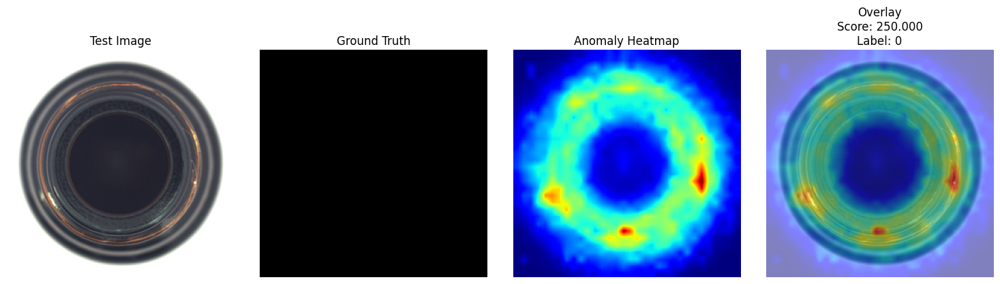

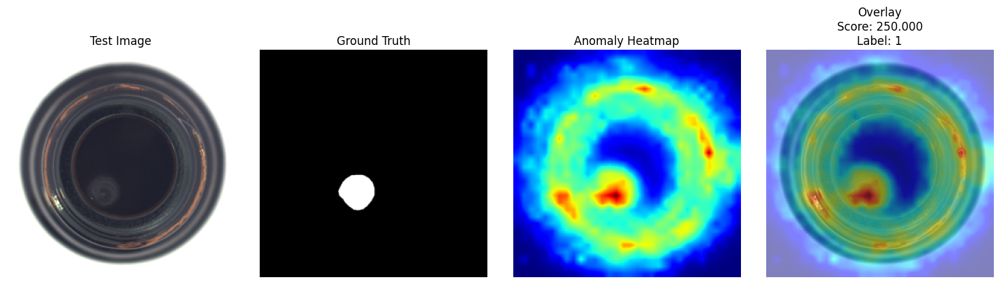

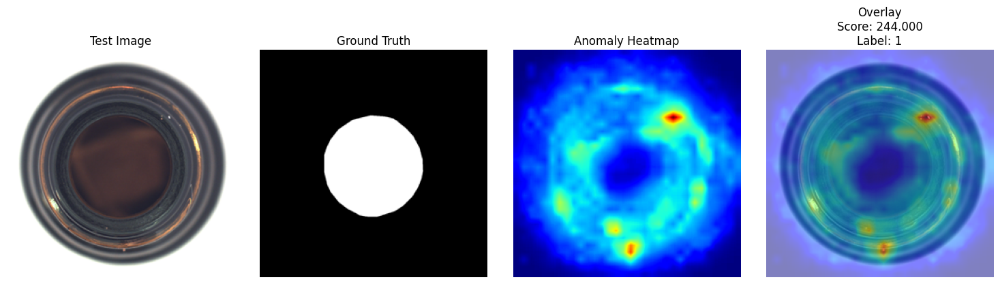

Image-level AUC: 0.6456
Pixel-level AUC: 0.9236
Pixel-level AP: 0.5595
Pixel-level Precision: 0.1567, Recall: 0.9690, F1: 0.2697

[CARPET] PatchCore Baseline 평가...


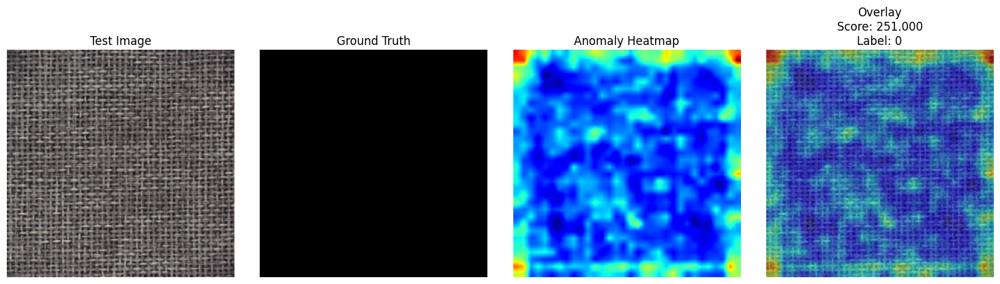

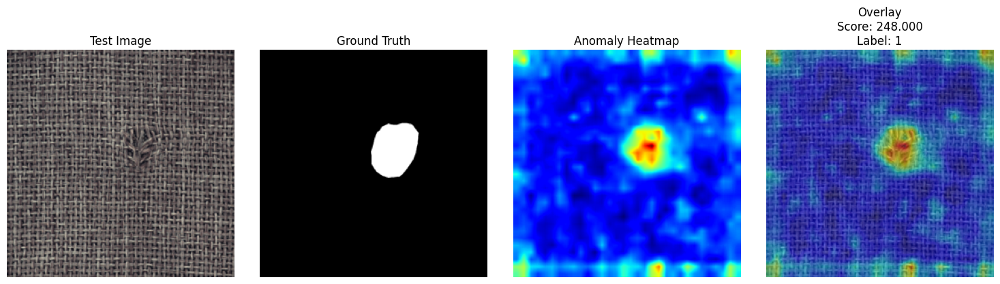

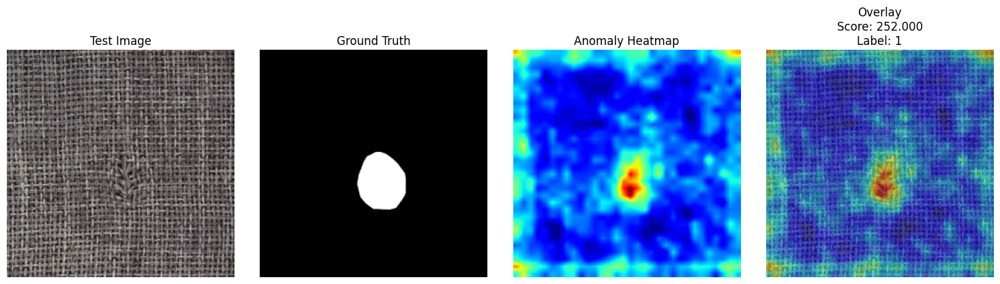

Image-level AUC: 0.2247
Pixel-level AUC: 0.9365
Pixel-level AP: 0.3346
Pixel-level Precision: 0.0532, Recall: 0.9721, F1: 0.1009

[GRID] PatchCore Baseline 평가...


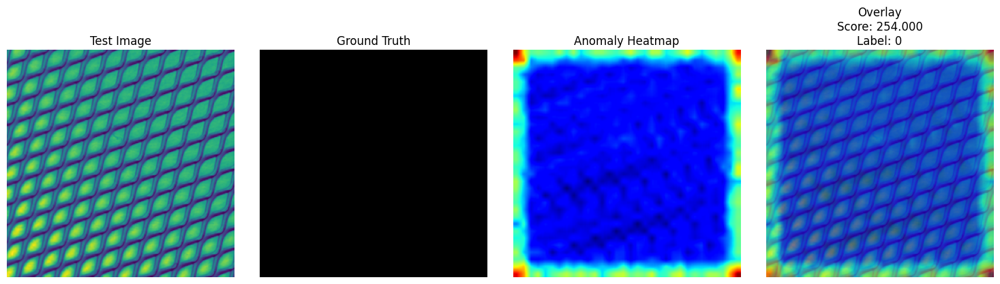

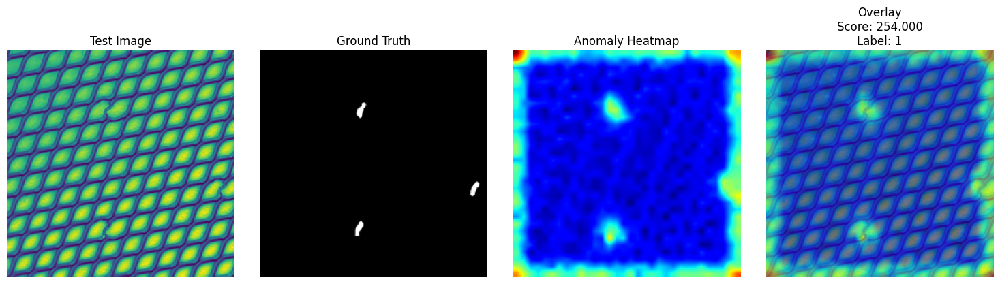

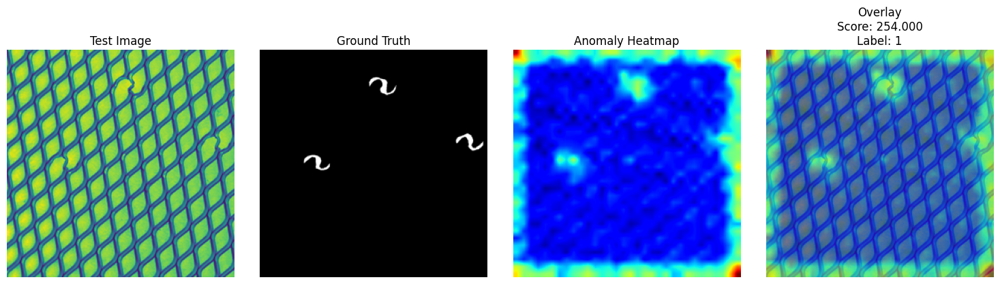

Image-level AUC: 0.4415
Pixel-level AUC: 0.8802
Pixel-level AP: 0.0446
Pixel-level Precision: 0.0303, Recall: 0.9709, F1: 0.0588

[WOOD] PatchCore Baseline 평가...


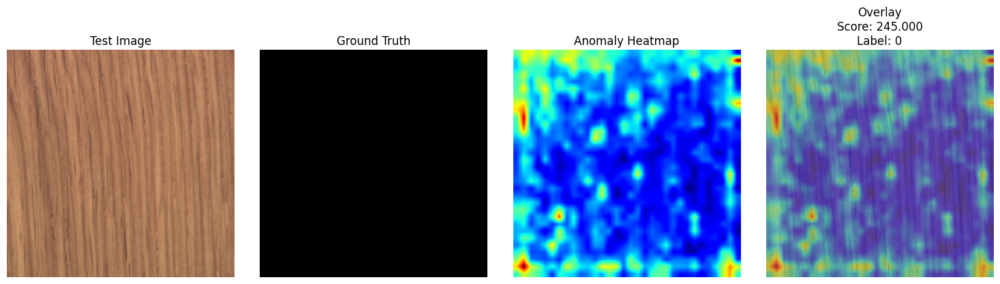

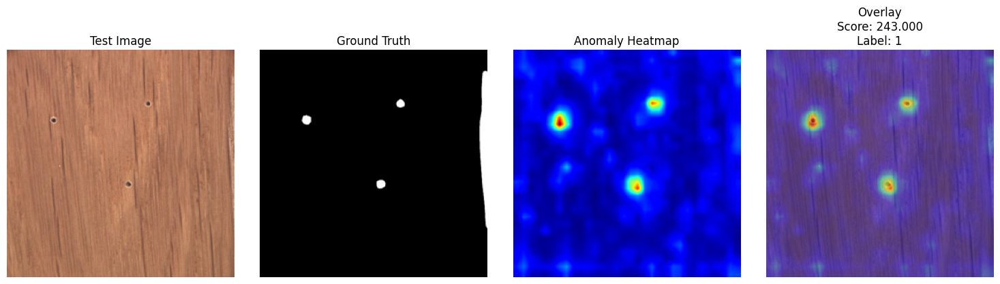

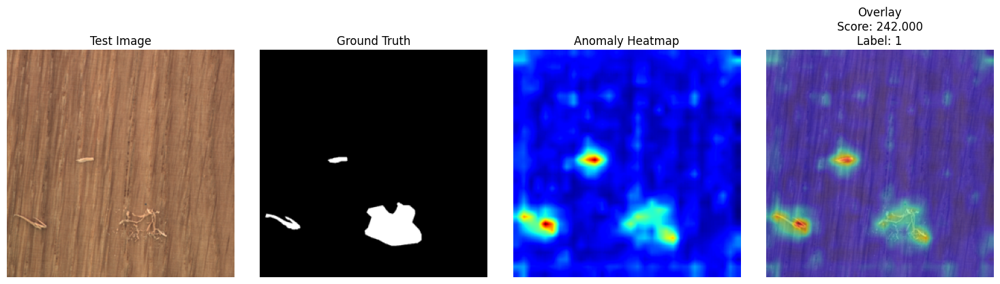

Image-level AUC: 0.5022
Pixel-level AUC: 0.8899
Pixel-level AP: 0.3772
Pixel-level Precision: 0.1704, Recall: 0.8364, F1: 0.2831

[ZIPPER] PatchCore Baseline 평가...


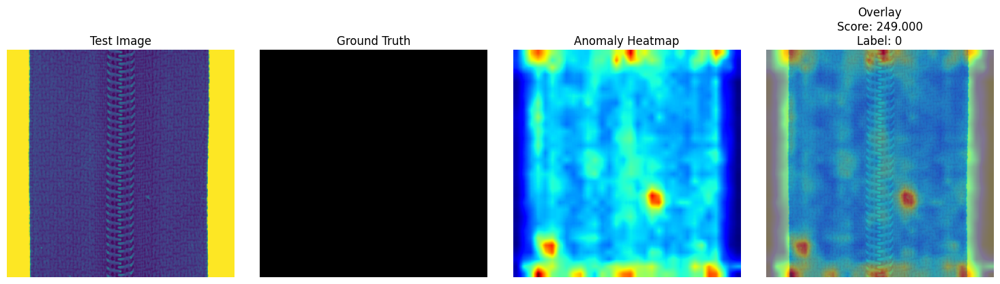

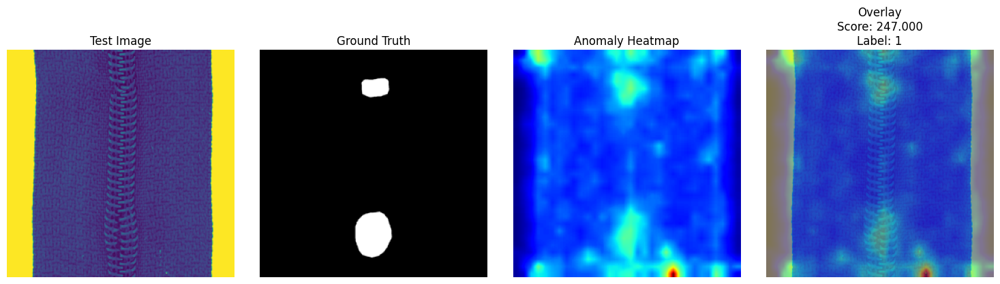

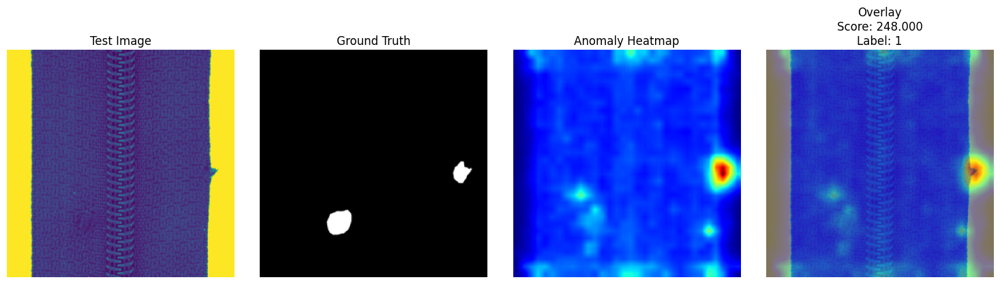

Image-level AUC: 0.3671
Pixel-level AUC: 0.9292
Pixel-level AP: 0.3304
Pixel-level Precision: 0.0393, Recall: 0.9940, F1: 0.0756

=== PatchCore 클래스별 성능 요약 ===
    class  img_auc  pix_auc  pix_ap  pix_prec  pix_rec  pix_f1
0  bottle   0.6456   0.9236  0.5595    0.1567   0.9690  0.2697
1  carpet   0.2247   0.9365  0.3346    0.0532   0.9721  0.1009
2    grid   0.4415   0.8802  0.0446    0.0303   0.9709  0.0588
3    wood   0.5022   0.8899  0.3772    0.1704   0.8364  0.2831
4  zipper   0.3671   0.9292  0.3304    0.0393   0.9940  0.0756

=== 낮은 성능 클래스 (F1 < 0.7) ===
    class  img_auc  pix_f1
0  bottle   0.6456  0.2697
1  carpet   0.2247  0.1009
2    grid   0.4415  0.0588
3    wood   0.5022  0.2831
4  zipper   0.3671  0.0756

결과가 patchcore_baseline_results.csv 파일로 저장되었습니다.


In [20]:
if __name__ == "__main__":
    # MVTec AD 데이터셋 경로 설정
    data_dir = './data'  # 실제 경로로 변경 필요
    
    # 평가할 클래스들
    classes = ['bottle', 'carpet', 'grid', 'wood', 'zipper']
    
    # 결과 저장용 리스트
    summary = []
    
    # 각 클래스별 평가 수행
    for cls in classes:
        results = baseline_patchcore_mvtec(data_dir, cls) #show_viz=True, viz_limit=3
        summary.append(results)
    
    # DataFrame으로 요약
    df = pd.DataFrame(summary)
    print('\n=== PatchCore 클래스별 성능 요약 ===')
    print(df.round(4))
    
    # 성능이 낮은 클래스 분석
    print('\n=== 낮은 성능 클래스 (F1 < 0.7) ===')
    low_perf = df[df['pix_f1'] < 0.7]
    if not low_perf.empty:
        print(low_perf[['class', 'img_auc', 'pix_f1']].round(4))
    else:
        print('모든 클래스가 양호한 성능을 보입니다.')
    
    # 결과를 CSV로 저장
    df.to_csv('patchcore_baseline_results.csv', index=False)
    print('\n결과가 patchcore_baseline_results.csv 파일로 저장되었습니다.')

2. 실패 원인 분석

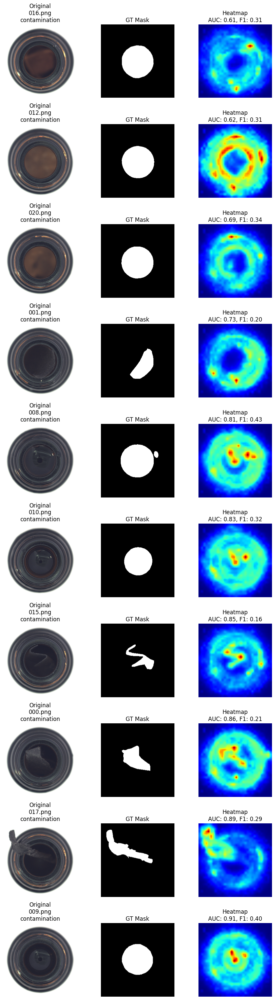

In [49]:
# 아래는 'carpet' 클래스 예시, 다른 클래스도 반복 가능
target_class = 'bottle' #carpet, bottle, grid, wood, zipper
n_show = 10  # 시각화할 샘플 수

# 각 결함 이미지의 픽셀 단위 AUC/혹은 F1을 저장할 리스트
sample_infos = []

test_imgs, test_labels, defect_types = get_test_image_list_and_labels(data_dir, target_class)
fnames = [os.path.basename(p) for p in test_imgs]
gt_mask_paths = get_gt_mask_list(data_dir, target_class, defect_types, fnames)
model = FeatureExtractor().to(device)
train_imgs = sorted(glob.glob(os.path.join(data_dir, target_class, 'train', 'good', '*.png')))
train_features = extract_patch_features(model, train_imgs)
coreset = build_coreset(train_features, n_samples=10000)

for idx, (test_path, gt_mask_path, defect_type) in enumerate(zip(test_imgs, gt_mask_paths, defect_types)):
    gt_mask = load_mask_or_zero(gt_mask_path, shape=(256,256))
    if gt_mask_path is None or np.sum(gt_mask > 127) == 0:
        continue
    test_feats = extract_patch_features(model, [test_path])
    patch_scores = compute_anomaly_map(test_feats, coreset, k=5)
    heatmap = score_to_heatmap(patch_scores, patch_map_size=(32,32), img_size=(256,256))
    norm_heatmap = heatmap / 255.0
    gt_bin = (gt_mask > 127)
    # F1-score (이진 heatmap)
    pred_mask = (norm_heatmap > 0.2)
    from sklearn.metrics import f1_score
    pix_f1 = f1_score(gt_bin.flatten(), pred_mask.flatten(), zero_division=0)
    # Pixel-level AUC (heatmap 값 자체로)
    from sklearn.metrics import roc_auc_score
    try:
        pix_auc = roc_auc_score(gt_bin.flatten(), norm_heatmap.flatten())
    except Exception:
        pix_auc = np.nan
    sample_infos.append({
        'idx': idx,
        'test_path': test_path,
        'gt_mask_path': gt_mask_path,
        'defect_type': defect_type,
        'pix_f1': pix_f1,
        'pix_auc': pix_auc,
        'heatmap': norm_heatmap,
        'gt_mask': gt_bin,
        'orig': np.array(Image.open(test_path).resize((256,256))),
    })

# AUC or F1-score 기준으로 낮은 순서로 N개 추출
sample_infos = sorted(sample_infos, key=lambda x: x['pix_auc'])
fail_samples = sample_infos[:n_show]

# 여러 장을 한꺼번에 plot
fig, axs = plt.subplots(n_show, 3, figsize=(9, 3*n_show))
for i, s in enumerate(fail_samples):
    axs[i,0].imshow(s['orig'])
    axs[i,0].set_title(f"Original\n{os.path.basename(s['test_path'])}\n{str(s['defect_type'])}")
    axs[i,1].imshow(s['gt_mask'], cmap='gray')
    axs[i,1].set_title("GT Mask")
    axs[i,2].imshow(s['heatmap'], cmap='jet')
    axs[i,2].set_title(f"Heatmap\nAUC: {s['pix_auc']:.2f}, F1: {s['pix_f1']:.2f}")
    for j in range(3): axs[i,j].axis('off')
plt.tight_layout()
plt.show()


In [50]:
import os
import matplotlib.pyplot as plt

save_dir = './failed_heatmaps'
os.makedirs(save_dir, exist_ok=True)

n_show = 10  # 저장할 샘플 개수

fig, axs = plt.subplots(n_show, 3, figsize=(12, 4 * n_show))
for i, s in enumerate(fail_samples):
    axs[i, 0].imshow(s['orig'])
    axs[i, 0].set_title(f"Original\n{os.path.basename(s['test_path'])}\n{str(s['defect_type'])}")
    axs[i, 1].imshow(s['gt_mask'], cmap='gray')
    axs[i, 1].set_title("GT Mask")
    axs[i, 2].imshow(s['heatmap'], cmap='jet')
    axs[i, 2].set_title(f"Heatmap\nAUC: {s['pix_auc']:.2f}, F1: {s['pix_f1']:.2f}")
    for j in range(3): axs[i, j].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(save_dir, f"{target_class}_fail_samples_grid.png"))
plt.close(fig)
print(f"{target_class}_fail_samples_grid.png 저장 완료")


bottle_fail_samples_grid.png 저장 완료


클래스별 실패 유형 자동 요약 표 생성

In [51]:
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.metrics import f1_score, roc_auc_score

def analyze_fail_samples(fail_samples, class_name):
    rows = []
    for s in fail_samples:
        gt_mask = s['gt_mask']
        # 결함 픽셀 수
        defect_area = np.sum(gt_mask)
        # 결함 위치 중심
        coords = np.column_stack(np.where(gt_mask))
        if coords.size > 0:
            y_center, x_center = coords.mean(axis=0)
            on_edge = (x_center < 32) or (x_center > 224) or (y_center < 32) or (y_center > 224)
        else:
            y_center, x_center, on_edge = np.nan, np.nan, False
        rows.append({
            "class": class_name,
            "filename": s['test_path'],
            "defect_type": s['defect_type'],
            "defect_area": defect_area,
            "center_x": x_center,
            "center_y": y_center,
            "on_edge": on_edge,
            "auc": s['pix_auc'],
            "f1": s['pix_f1']
        })
    df = pd.DataFrame(rows)
    return df

def make_fail_samples_for_class(class_name, n_show=10):
    # 1. 데이터 로드
    test_imgs, test_labels, defect_types = get_test_image_list_and_labels(data_dir, class_name)
    fnames = [os.path.basename(p) for p in test_imgs]
    gt_mask_paths = get_gt_mask_list(data_dir, class_name, defect_types, fnames)
    model = FeatureExtractor().to(device)
    train_imgs = sorted(glob.glob(os.path.join(data_dir, class_name, 'train', 'good', '*.png')))
    train_features = extract_patch_features(model, train_imgs)
    coreset = build_coreset(train_features, n_samples=10000)

    sample_infos = []
    for idx, (test_path, gt_mask_path, defect_type) in enumerate(zip(test_imgs, gt_mask_paths, defect_types)):
        gt_mask = load_mask_or_zero(gt_mask_path, shape=(256,256))
        if gt_mask_path is None or np.sum(gt_mask > 127) == 0:
            continue
        test_feats = extract_patch_features(model, [test_path])
        patch_scores = compute_anomaly_map(test_feats, coreset, k=5)
        heatmap = score_to_heatmap(patch_scores, patch_map_size=(32,32), img_size=(256,256))
        norm_heatmap = heatmap / 255.0
        gt_bin = (gt_mask > 127)
        pred_mask = (norm_heatmap > 0.2)
        try:
            pix_f1 = f1_score(gt_bin.flatten(), pred_mask.flatten(), zero_division=0)
        except Exception:
            pix_f1 = np.nan
        try:
            pix_auc = roc_auc_score(gt_bin.flatten(), norm_heatmap.flatten())
        except Exception:
            pix_auc = np.nan
        sample_infos.append({
            'idx': idx,
            'test_path': test_path,
            'gt_mask_path': gt_mask_path,
            'defect_type': defect_type,
            'pix_f1': pix_f1,
            'pix_auc': pix_auc,
            'heatmap': norm_heatmap,
            'gt_mask': gt_bin,
            'orig': np.array(Image.open(test_path).resize((256,256))),
        })

    # 2. 실패 케이스만 N개 추출 (예: AUC 기준 낮은 순)
    fail_samples = sorted(sample_infos, key=lambda x: x['pix_auc'])[:n_show]
    return fail_samples, sample_infos

# 사용 예시 (클래스별로)
class_names = ['carpet', 'grid', 'wood', 'zipper']
fail_samples_dict = {}
all_sample_infos = {}
df_list = []
n_show = 10

for cname in class_names:
    print(f"\n[{cname}] 실패 케이스 추출 중...")
    fail_samples, sample_infos = make_fail_samples_for_class(cname, n_show=n_show)
    fail_samples_dict[cname] = fail_samples
    all_sample_infos[cname] = sample_infos
    df = analyze_fail_samples(fail_samples, cname)
    df_list.append(df)
    print(df.head())

# 통합 데이터프레임
df_all = pd.concat(df_list, ignore_index=True)
print("\n[통합 실패 케이스 요약]")
print(df_all.head())



[carpet] 실패 케이스 추출 중...
    class                           filename defect_type  defect_area  \
0  carpet  ./data/carpet/test/thread/015.png      thread          420   
1  carpet  ./data/carpet/test/thread/012.png      thread         1834   
2  carpet   ./data/carpet/test/color/006.png       color         1586   
3  carpet  ./data/carpet/test/thread/013.png      thread         3521   
4  carpet    ./data/carpet/test/hole/016.png        hole         1630   

     center_x    center_y  on_edge       auc        f1  
0   60.595238  121.073810    False  0.847418  0.020239  
1   67.131407  156.629771    False  0.854773  0.255875  
2  131.373897  175.836066    False  0.871682  0.079682  
3  154.300767  113.299063    False  0.879542  0.318026  
4   64.490184  142.423313    False  0.888164  0.213474  

[grid] 실패 케이스 추출 중...
  class                         filename defect_type  defect_area    center_x  \
0  grid  ./data/grid/test/thread/008.png      thread         2352  140.421344   
1  grid  

In [52]:
# 결함 종류별 평균 F1, AUC, 결함 크기(평균), 경계 비율
stat = df_all.groupby(['class', 'defect_type']).agg({
    'auc': 'mean',
    'f1': 'mean',
    'defect_area': ['mean', 'count'],
    'on_edge': 'mean'
}).reset_index()
stat.columns = ['class', 'defect_type', 'auc_mean', 'f1_mean', 'area_mean', 'case_count', 'on_edge_ratio']
print('\n=== 결함 종류별 실패 케이스 통계 ===')
print(stat)



=== 결함 종류별 실패 케이스 통계 ===
     class      defect_type  auc_mean   f1_mean     area_mean  case_count  \
0   carpet            color  0.889823  0.048101    978.000000           2   
1   carpet              cut  0.911715  0.178038   3047.500000           2   
2   carpet             hole  0.898615  0.154913   1745.000000           2   
3   carpet           thread  0.868648  0.151638   1492.000000           4   
4     grid             glue  0.828342  0.038123    366.800000           5   
5     grid           thread  0.788940  0.113786   1525.600000           5   
6     wood            color  0.759089  0.252979   3283.500000           2   
7     wood           liquid  0.736732  0.161010   3821.500000           4   
8     wood          scratch  0.769726  0.314531  10567.750000           4   
9   zipper         combined  0.907702  0.203154   2926.500000           2   
10  zipper  fabric_interior  0.887591  0.047095   1259.833333           6   
11  zipper            rough  0.919329  0.145150   

3. 개선 조건 적용

In [78]:
import cv2
import numpy as np
from torchvision import models

# 1. 전처리 함수 예시
def preprocess_image(img, method):
    if method == "clahe":
        # Adaptive Histogram Equalization
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl = clahe.apply(l)
        limg = cv2.merge((cl, a, b))
        return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
    elif method == "median":
        return cv2.medianBlur(img, 5)
    elif method == "gaussian":
        return cv2.GaussianBlur(img, (5,5), 0)
    elif method == "bilateral":
        return cv2.bilateralFilter(img, 9, 75, 75)
    elif method == "sharpen":
        kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
        return cv2.filter2D(img, -1, kernel)
    else:  # "none" 등
        return img

# 2. FeatureExtractor 커스터마이즈
class FeatureExtractor(nn.Module):
    def __init__(self, backbone='resnet18', layer='layer2'):
        super().__init__()
        resnet = getattr(models, backbone)(weights='IMAGENET1K_V1')
        self.stem = nn.Sequential(
            resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool, resnet.layer1
        )
        self.layer2 = resnet.layer2
        self.layer3 = resnet.layer3
        self.layer4 = resnet.layer4
        self.target = layer
    def forward(self, x):
        x = self.stem(x)
        out2 = self.layer2(x)
        if self.target == 'layer2':
            return out2
        out3 = self.layer3(out2)
        if self.target == 'layer3':
            return out3
        out4 = self.layer4(out3)
        if self.target == 'layer4':
            return out4
        # multi-layer concat (예: layer2+3)
        if self.target == 'layer2+3':
            # 채널 수 맞추기(upsample layer2), spatial align
            out2_up = nn.functional.interpolate(out2, size=out3.shape[2:], mode='bilinear', align_corners=False)
            return torch.cat([out2_up, out3], dim=1)
        if self.target == 'layer3+4':
            out3_up = nn.functional.interpolate(out3, size=out4.shape[2:], mode='bilinear', align_corners=False)
            return torch.cat([out3_up, out4], dim=1)
        raise ValueError(f"Unknown layer setting: {self.target}")

# 3. 개선 실험 자동화 함수
def run_patchcore_experiment(
    data_dir, cls,
    patch_size=16,
    k=5,
    backbone='resnet18',
    layer='layer2',
    preprocessing='none',
    n_train=100,  # 빠른 실험용
    n_test=30
):
    import torch
    # 전처리와 feature 추출 모두 포함
    test_imgs, test_labels, defect_types = get_test_image_list_and_labels(data_dir, cls)
    fnames = [os.path.basename(p) for p in test_imgs]
    gt_mask_paths = get_gt_mask_list(data_dir, cls, defect_types, fnames)
    model = FeatureExtractor(backbone=backbone, layer=layer).to(device)
    train_imgs = sorted(glob.glob(os.path.join(data_dir, cls, 'train', 'good', '*.png')))[:n_train]
    # train feature 추출
    train_features = []
    for p in train_imgs:
        img = np.array(Image.open(p).convert('RGB').resize((256,256)))
        img_prep = preprocess_image(img, preprocessing)
        x = torch.from_numpy(img_prep.transpose(2,0,1)/255.0).float().unsqueeze(0).to(device)
        feat = model(x)
        patches = feat.squeeze().permute(1,2,0).reshape(-1, feat.size(1)).cpu().detach().numpy()
        train_features.append(patches)
    train_features = np.concatenate(train_features, axis=0)
    coreset = build_coreset(train_features, n_samples=10000)
    # 테스트 평가
    all_auc, all_f1, all_pix_ap = [], [], []
    for test_path, gt_mask_path in zip(test_imgs[:n_test], gt_mask_paths[:n_test]):
        gt_mask = load_mask_or_zero(gt_mask_path, shape=(256,256))
        if gt_mask_path is None or np.sum(gt_mask > 127) == 0:
            continue
        img = np.array(Image.open(test_path).convert('RGB').resize((256,256)))
        img_prep = preprocess_image(img, preprocessing)
        x = torch.from_numpy(img_prep.transpose(2,0,1)/255.0).float().unsqueeze(0).to(device)
        feat = model(x)
        feature_shape = feat.squeeze().shape[1:]
        patches = feat.squeeze().permute(1,2,0).reshape(-1, feat.size(1)).cpu().detach().numpy()
        patch_scores = compute_anomaly_map(patches, coreset, k=k)
        heatmap = score_to_heatmap(patch_scores, patch_map_size=feature_shape, img_size=(256,256))
        norm_heatmap = heatmap / 255.0
        gt_bin = (gt_mask > 127)
        pred_mask = (norm_heatmap > 0.2)
        from sklearn.metrics import f1_score, roc_auc_score, average_precision_score
        try:
            pix_auc = roc_auc_score(gt_bin.flatten(), norm_heatmap.flatten())
            pix_f1 = f1_score(gt_bin.flatten(), pred_mask.flatten(), zero_division=0)
            pix_ap = average_precision_score(gt_bin.flatten(), norm_heatmap.flatten())
            all_auc.append(pix_auc)
            all_f1.append(pix_f1)
            all_pix_ap.append(pix_ap)
        except Exception:
            continue
    # 결과 반환
    return {
        "cls": cls,
        "patch_size": patch_size,
        "k": k,
        "backbone": backbone,
        "layer": layer,
        "preprocessing": preprocessing,
        "pix_auc": np.mean(all_auc),
        "pix_f1": np.mean(all_f1),
        "pix_ap": np.mean(all_pix_ap)
    }

# 4. 실험 파라미터 반복조합
import itertools
param_grid = {
    'patch_size': [16, 32],
    'k': [3, 5, 10],
    'backbone': ['resnet18', 'resnet34'],
    'layer': ['layer2', 'layer3', 'layer2+3'],
    'preprocessing': ['none', 'clahe', 'median']
}

from tqdm import tqdm
results = []
for cls in ['carpet', 'grid', 'wood', 'zipper']:
    for patch_size, k, backbone, layer, preprocessing in tqdm(
        itertools.product(
            param_grid['patch_size'],
            param_grid['k'],
            param_grid['backbone'],
            param_grid['layer'],
            param_grid['preprocessing']
        )
    ):
        # 클래스별로 추천 파라미터만 실험하고 싶으면 조건 추가 가능
        result = run_patchcore_experiment(
            data_dir, cls,
            patch_size=patch_size,
            k=k,
            backbone=backbone,
            layer=layer,
            preprocessing=preprocessing
        )
        results.append(result)

import pandas as pd
results_df = pd.DataFrame(results)
print(results_df)


0it [00:00, ?it/s]

0.2%[01:14,  8.69s/it]

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /Users/jongmin/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100.0%
108it [17:29,  9.72s/it]
108it [14:09,  7.86s/it]
108it [16:48,  9.34s/it]
108it [14:39,  8.14s/it]

        cls  patch_size   k  backbone     layer preprocessing   pix_auc  \
0    carpet          16   3  resnet18    layer2          none  0.922530   
1    carpet          16   3  resnet18    layer2         clahe  0.910860   
2    carpet          16   3  resnet18    layer2        median  0.851110   
3    carpet          16   3  resnet18    layer3          none  0.869411   
4    carpet          16   3  resnet18    layer3         clahe  0.853840   
..      ...         ...  ..       ...       ...           ...       ...   
427  zipper          32  10  resnet34    layer3         clahe  0.956623   
428  zipper          32  10  resnet34    layer3        median  0.920920   
429  zipper          32  10  resnet34  layer2+3          none  0.985262   
430  zipper          32  10  resnet34  layer2+3         clahe  0.982252   
431  zipper          32  10  resnet34  layer2+3        median  0.957359   

       pix_f1    pix_ap  
0    0.038766  0.253335  
1    0.042643  0.256589  
2    0.035148  0.1668

In [79]:
results_df.to_csv("patchcore_experiment_results.csv", index=False)

In [82]:
import pandas as pd

# 1. 데이터 불러오기
df = pd.read_csv("patchcore_experiment_results.csv")

# 2. 클래스별로 F1-score가 가장 높은 파라미터 조합과 성능
best_per_class = df.loc[df.groupby('cls')['pix_f1'].idxmax()]
print("=== 클래스별 최적 파라미터 조합 및 성능 (F1-score 기준) ===")
print(best_per_class[['cls','patch_size','k','backbone','layer','preprocessing','pix_f1','pix_auc','pix_ap']])

# 3. 클래스별로 AUC가 가장 높은 파라미터 조합과 성능
best_per_class_2 = df.loc[df.groupby('cls')['pix_auc'].idxmax()]
print("=== 클래스별 최적 파라미터 조합 및 성능 (AUC 기준) ===")
print(best_per_class_2[['cls','patch_size','k','backbone','layer','preprocessing','pix_f1','pix_auc','pix_ap']])

# 4. 파라미터별 평균 성능 (예: patch_size, k, preprocessing 등)
for param in ['patch_size','k','preprocessing']:
    stat = df.groupby([param, 'cls'])[['pix_f1','pix_auc']].mean().reset_index()
    print(f"\n=== {param} 별 클래스별 평균 성능 ===")
    print(stat)

# 5. 전체에서 F1-score 상위 10개 조합 보기
top10 = df.sort_values('pix_f1', ascending=False).head(10)
print("\n=== 전체 실험 중 F1-score 상위 10개 조합 ===")
print(top10[['cls','patch_size','k','backbone','layer','preprocessing','pix_f1','pix_auc','pix_ap']])

# 5. 전체에서 AUC 상위 10개 조합 보기
top10 = df.sort_values('pix_auc', ascending=False).head(10)
print("\n=== 전체 실험 중 AUC 상위 10개 조합 ===")
print(top10[['cls','patch_size','k','backbone','layer','preprocessing','pix_f1','pix_auc','pix_ap']])


=== 클래스별 최적 파라미터 조합 및 성능 (F1-score 기준) ===
        cls  patch_size   k  backbone     layer preprocessing    pix_f1  \
44   carpet          16  10  resnet18  layer2+3        median  0.057675   
144    grid          16  10  resnet18    layer2          none  0.035978   
263    wood          16  10  resnet34    layer2        median  0.183756   
375  zipper          16  10  resnet34  layer2+3          none  0.064496   

      pix_auc    pix_ap  
44   0.810395  0.106075  
144  0.904309  0.053162  
263  0.845922  0.343875  
375  0.985262  0.649759  
=== 클래스별 최적 파라미터 조합 및 성능 (AUC 기준) ===
        cls  patch_size  k  backbone     layer preprocessing    pix_f1  \
9    carpet          16  3  resnet34    layer2          none  0.048128   
117    grid          16  3  resnet34    layer2          none  0.028314   
231    wood          16  3  resnet34  layer2+3          none  0.166890   
339  zipper          16  3  resnet34  layer2+3          none  0.063654   

      pix_auc    pix_ap  
9    0.937290  0

AUC/PR 곡선 비교

In [21]:
# 클래스별 best 조합을 사전으로 관리 (직접 실험 결과 기반으로 수정)
best_params = {
    'carpet':  {'backbone':'resnet18', 'layer':'layer2+3', 'preprocessing':'median', 'patch_size':16, 'k':10},
    'grid':    {'backbone':'resnet18', 'layer':'layer2',   'preprocessing':'none', 'patch_size':16, 'k':10},
    'wood':    {'backbone':'resnet34', 'layer':'layer2',   'preprocessing':'median',   'patch_size':16, 'k':10},
    'zipper':  {'backbone':'resnet34', 'layer':'layer2+3',   'preprocessing':'none',  'patch_size':16, 'k':10}
}


In [25]:
import cv2
import numpy as np

def preprocess_image(img, method='none'):
    if method == "clahe":
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl = clahe.apply(l)
        limg = cv2.merge((cl, a, b))
        return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
    elif method == "median":
        return cv2.medianBlur(img, 5)
    elif method == "gaussian":
        return cv2.GaussianBlur(img, (5,5), 0)
    elif method == "bilateral":
        return cv2.bilateralFilter(img, 9, 75, 75)
    elif method == "sharpen":
        kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
        return cv2.filter2D(img, -1, kernel)
    else:
        return img  # "none" 등


In [27]:
class FeatureExtractor34(nn.Module):
    def __init__(self, layer='layer2'):
        super().__init__()
        resnet = models.resnet34(weights='IMAGENET1K_V1')
        self.features = nn.Sequential(
            resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool,
            resnet.layer1
        )
        if layer == 'layer2':
            self.features.add_module("layer2", resnet.layer2)
        elif layer == 'layer2+3':
            self.features.add_module("layer2", resnet.layer2)
            self.features.add_module("layer3", resnet.layer3)
        else:
            raise ValueError("지원되지 않는 layer 지정")
    def forward(self, x):
        return self.features(x)


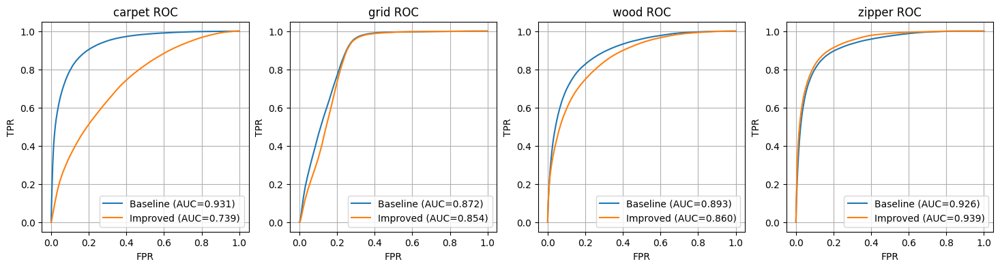

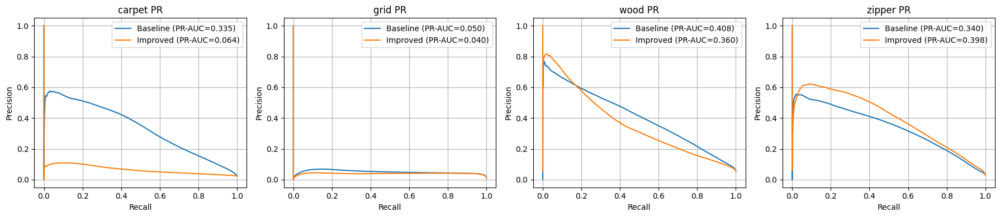

In [45]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, precision_recall_curve, auc, f1_score

def eval_patchcore_model(model, coreset, test_imgs, gt_mask_paths, param, threshold=None):
    model.eval()
    y_true, y_score = [], []
    for test_path, gt_mask_path in zip(test_imgs, gt_mask_paths):
        gt_mask = load_mask_or_zero(gt_mask_path, shape=(256,256))
        gt_bin = (gt_mask > 0).astype(np.uint8)
        if np.sum(gt_bin) == 0: continue
        img = Image.open(test_path).convert('RGB').resize((256,256))
        img_np = np.array(img)
        if param.get('preprocessing', 'none') != 'none':
            img_np = preprocess_image(img_np, method=param['preprocessing'])
        x = torch.from_numpy(img_np.transpose(2,0,1)/255.0).float().unsqueeze(0).to(model.device if hasattr(model, "device") else "cpu")
        with torch.no_grad():
            feat = model(x)
        patches = feat.squeeze().permute(1,2,0).reshape(-1, feat.size(1)).cpu().detach().numpy()
        feature_shape = feat.squeeze().shape[1:]
        patch_scores = compute_anomaly_map(patches, coreset, k=param['k'])
        heatmap = score_to_heatmap(patch_scores, patch_map_size=feature_shape, img_size=(256,256))
        norm_heatmap = heatmap / 255.0
        y_true.extend(gt_bin.flatten())
        y_score.extend(norm_heatmap.flatten())
    y_true = np.array(y_true)
    y_score = np.array(y_score)
    if threshold is None:
        threshold = 0.2
    pred_bin = (y_score > threshold).astype(int)
    f1 = f1_score(y_true, pred_bin, zero_division=0)
    return y_true, y_score, f1

# 메인 비교 코드
classes = ['carpet', 'grid', 'wood', 'zipper']
fig_roc, axs_roc = plt.subplots(1, len(classes), figsize=(18, 4))
fig_pr, axs_pr = plt.subplots(1, len(classes), figsize=(18, 4))

for i, cls in enumerate(classes):
    baseline_param = {'backbone':'resnet18','layer':'layer2','preprocessing':'none','patch_size':32,'k':5}
    best_param = best_params[cls]
    # Baseline
    model_base = FeatureExtractor().to(device)
    train_imgs_base = sorted(glob.glob(os.path.join(data_dir, cls, 'train', 'good', '*.png')))
    train_features_base = extract_patch_features(model_base, train_imgs_base)
    coreset_base = build_coreset(train_features_base, n_samples=10000)
    # Improved
    if best_param['backbone'] == 'resnet18':
        model_impr = FeatureExtractor().to(device)
    elif best_param['backbone'] == 'resnet34':
        model_impr = FeatureExtractor34(layer=best_param['layer']).to(device)
    train_imgs_impr = sorted(glob.glob(os.path.join(data_dir, cls, 'train', 'good', '*.png')))
    train_features_impr = extract_patch_features(model_impr, train_imgs_impr)
    coreset_impr = build_coreset(train_features_impr, n_samples=10000)
    # Test set
    test_imgs, _, defect_types = get_test_image_list_and_labels(data_dir, cls)
    fnames = [os.path.basename(p) for p in test_imgs]
    gt_mask_paths = get_gt_mask_list(data_dir, cls, defect_types, fnames)

    for name, (model, coreset, param) in {
        'Baseline': (model_base, coreset_base, baseline_param),
        'Improved': (model_impr, coreset_impr, best_param)
    }.items():
        y_true, y_score, _ = eval_patchcore_model(model, coreset, test_imgs, gt_mask_paths, param)
        # ROC
        fpr, tpr, _ = roc_curve(y_true, y_score)
        roc_auc = auc(fpr, tpr)
        axs_roc[i].plot(fpr, tpr, label=f'{name} (AUC={roc_auc:.3f})')
        # PR
        prec, rec, _ = precision_recall_curve(y_true, y_score)
        pr_auc = auc(rec, prec)
        axs_pr[i].plot(rec, prec, label=f'{name} (PR-AUC={pr_auc:.3f})')
    axs_roc[i].set_title(f'{cls} ROC')
    axs_roc[i].set_xlabel('FPR')
    axs_roc[i].set_ylabel('TPR')
    axs_roc[i].legend(); axs_roc[i].grid(True)
    axs_pr[i].set_title(f'{cls} PR')
    axs_pr[i].set_xlabel('Recall')
    axs_pr[i].set_ylabel('Precision')
    axs_pr[i].legend(); axs_pr[i].grid(True)

plt.tight_layout()
plt.show()


=== carpet ===


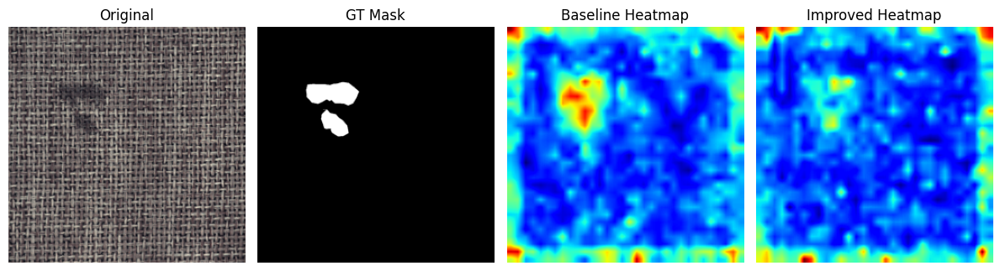

=== grid ===


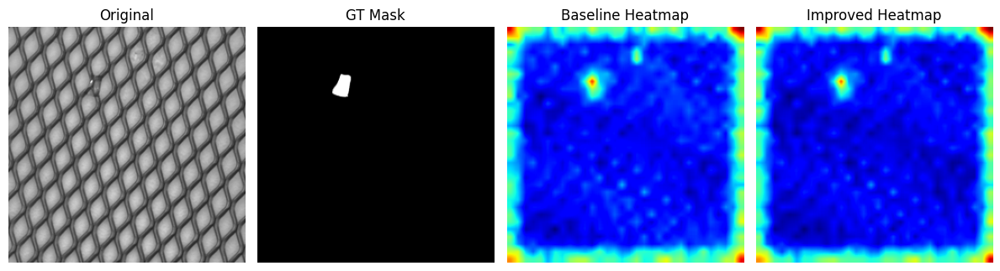

=== wood ===


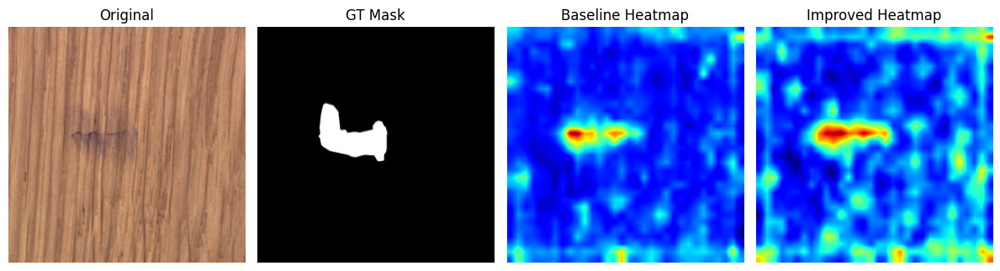

=== zipper ===


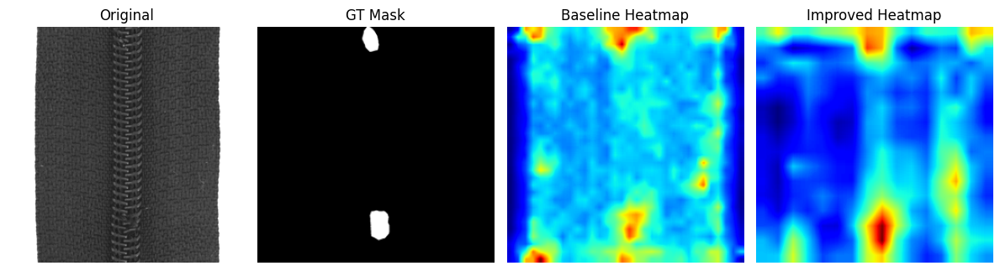

In [47]:
classes = ['carpet', 'grid', 'wood', 'zipper']
sample_idx = 0  # 각 클래스별로 대표 이미지 인덱스(원하면 바꿔가며 반복)

for cls in classes:
    print(f"=== {cls} ===")
    # 모델/코어셋/파라미터 불러오기
    baseline_param = {'backbone':'resnet18','layer':'layer2','preprocessing':'none','patch_size':32,'k':5}
    best_param = best_params[cls]

    # 모델 준비 (네가 이미 사용한 구조와 동일)
    model_base = FeatureExtractor().to(device)
    train_imgs_base = sorted(glob.glob(os.path.join(data_dir, cls, 'train', 'good', '*.png')))
    train_features_base = extract_patch_features(model_base, train_imgs_base)
    coreset_base = build_coreset(train_features_base, n_samples=10000)
    if best_param['backbone'] == 'resnet18':
        model_impr = FeatureExtractor().to(device)
    elif best_param['backbone'] == 'resnet34':
        model_impr = FeatureExtractor34(layer=best_param['layer']).to(device)
    train_imgs_impr = sorted(glob.glob(os.path.join(data_dir, cls, 'train', 'good', '*.png')))
    train_features_impr = extract_patch_features(model_impr, train_imgs_impr)
    coreset_impr = build_coreset(train_features_impr, n_samples=10000)
    # 테스트셋
    test_imgs, _, defect_types = get_test_image_list_and_labels(data_dir, cls)
    fnames = [os.path.basename(p) for p in test_imgs]
    gt_mask_paths = get_gt_mask_list(data_dir, cls, defect_types, fnames)
    # 대표 defect 이미지 선택 (여기서는 defect_types가 good이 아닌 것 중 첫번째)
    defect_indices = [i for i, t in enumerate(defect_types) if t != 'good']
    if not defect_indices:
        print(f"{cls}: 결함 이미지 없음")
        continue
    idx = defect_indices[sample_idx] if len(defect_indices) > sample_idx else defect_indices[0]
    compare_heatmaps_on_image(
        test_imgs[idx], gt_mask_paths[idx],
        model_base, coreset_base, baseline_param,
        model_impr, coreset_impr, best_param
    )



===== CARPET =====
F1-optimal threshold=0.439 | Precision=0.096 | Recall=0.230 | F1=0.135


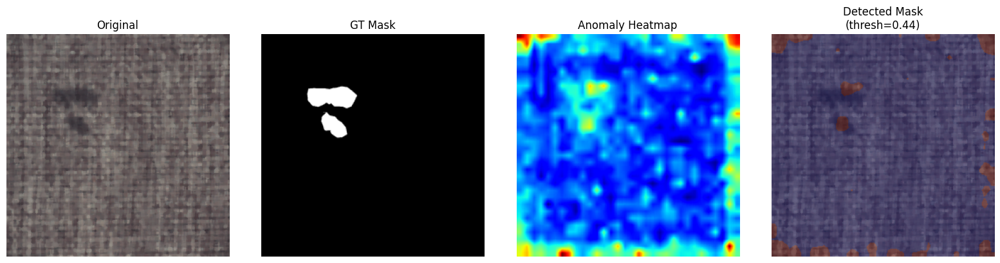


===== GRID =====
F1-optimal threshold=0.263 | Precision=0.042 | Recall=0.796 | F1=0.080


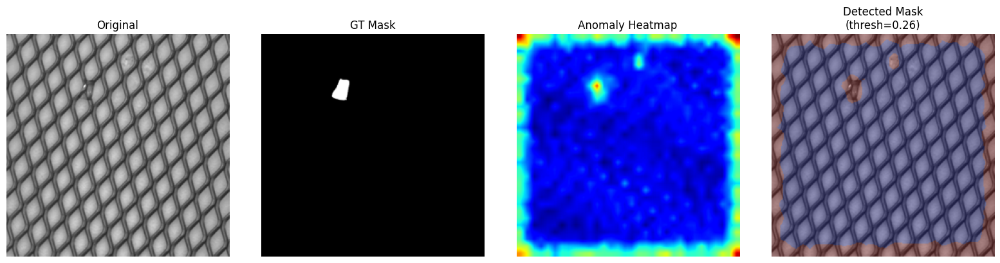


===== WOOD =====
F1-optimal threshold=0.404 | Precision=0.355 | Recall=0.418 | F1=0.384


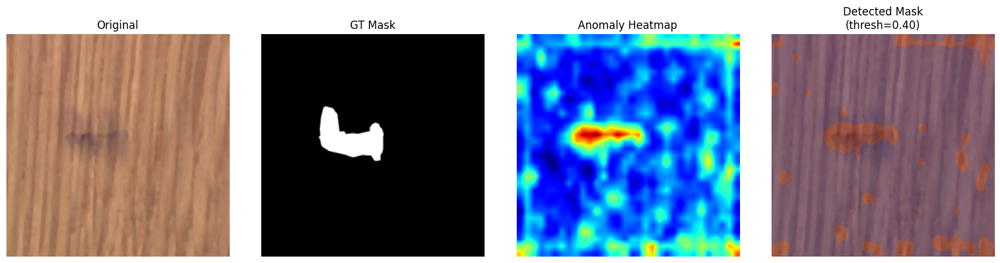


===== ZIPPER =====
F1-optimal threshold=0.600 | Precision=0.439 | Recall=0.492 | F1=0.464


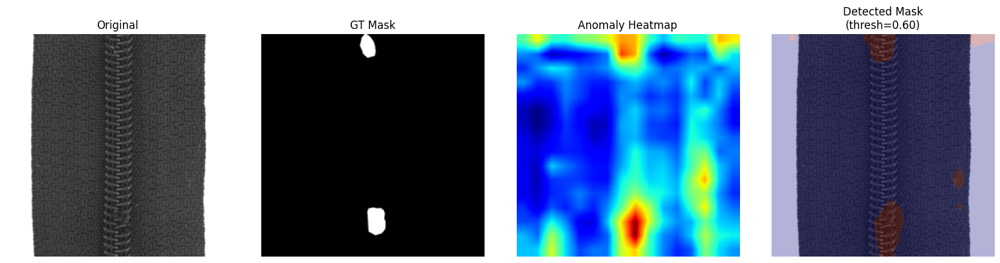

In [53]:
from sklearn.metrics import precision_recall_curve, f1_score
import matplotlib.pyplot as plt

def evaluate_f1_optimal_threshold(y_true, y_score):
    precision, recall, thresholds = precision_recall_curve(y_true, y_score)
    f1s = 2 * precision * recall / (precision + recall + 1e-8)
    best_idx = f1s.argmax()
    best_thresh = thresholds[best_idx-1] if best_idx > 0 else 0.5
    best_f1 = f1s[best_idx]
    best_prec = precision[best_idx]
    best_rec = recall[best_idx]
    return best_thresh, best_prec, best_rec, best_f1

def show_detection_result(test_path, gt_mask_path, model, coreset, param, threshold):
    img = Image.open(test_path).convert('RGB').resize((256,256))
    img_np = np.array(img)
    gt_mask = load_mask_or_zero(gt_mask_path, shape=(256,256))
    if param.get('preprocessing', 'none') != 'none':
        img_np = preprocess_image(img_np, method=param['preprocessing'])
    x = torch.from_numpy(img_np.transpose(2,0,1)/255.0).float().unsqueeze(0).to(model.device if hasattr(model,"device") else "cpu")
    with torch.no_grad():
        feat = model(x)
    patches = feat.squeeze().permute(1,2,0).reshape(-1, feat.size(1)).cpu().detach().numpy()
    feature_shape = feat.squeeze().shape[1:]
    patch_scores = compute_anomaly_map(patches, coreset, k=param['k'])
    heatmap = score_to_heatmap(patch_scores, patch_map_size=feature_shape, img_size=(256,256))
    norm_heatmap = heatmap / 255.0
    detected_mask = (norm_heatmap > threshold).astype(np.uint8)
    # 시각화
    plt.figure(figsize=(16,4))
    plt.subplot(1,4,1)
    plt.imshow(img_np); plt.title('Original')
    plt.axis('off')
    plt.subplot(1,4,2)
    plt.imshow(gt_mask, cmap='gray'); plt.title('GT Mask')
    plt.axis('off')
    plt.subplot(1,4,3)
    plt.imshow(heatmap, cmap='jet'); plt.title('Anomaly Heatmap')
    plt.axis('off')
    plt.subplot(1,4,4)
    plt.imshow(img_np)
    plt.imshow(detected_mask, cmap='jet', alpha=0.3)
    plt.title(f'Detected Mask\n(thresh={threshold:.2f})')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# 클래스별 자동 반복
classes = ['carpet', 'grid', 'wood', 'zipper']
sample_idx = 0  # 대표 결함 이미지 인덱스

for cls in classes:
    print(f"\n===== {cls.upper()} =====")
    best_param = best_params[cls]
    # 모델/코어셋 준비 (각자 환경에 맞게, 예시)
    if best_param['backbone'] == 'resnet18':
        model_impr = FeatureExtractor().to(device)
    elif best_param['backbone'] == 'resnet34':
        model_impr = FeatureExtractor34(layer=best_param['layer']).to(device)
    train_imgs_impr = sorted(glob.glob(os.path.join(data_dir, cls, 'train', 'good', '*.png')))
    train_features_impr = extract_patch_features(model_impr, train_imgs_impr)
    coreset_impr = build_coreset(train_features_impr, n_samples=10000)
    test_imgs, _, defect_types = get_test_image_list_and_labels(data_dir, cls)
    fnames = [os.path.basename(p) for p in test_imgs]
    gt_mask_paths = get_gt_mask_list(data_dir, cls, defect_types, fnames)
    # 평가 (모든 defect 이미지)
    y_true, y_score, _ = eval_patchcore_model(model_impr, coreset_impr, test_imgs, gt_mask_paths, best_param)
    # F1-optimal threshold 찾기
    best_thresh, best_prec, best_rec, best_f1 = evaluate_f1_optimal_threshold(y_true, y_score)
    print(f"F1-optimal threshold={best_thresh:.3f} | Precision={best_prec:.3f} | Recall={best_rec:.3f} | F1={best_f1:.3f}")
    # 대표 결함 이미지 찾기(첫번째 defect)
    defect_indices = [i for i, t in enumerate(defect_types) if t != 'good']
    if not defect_indices:
        print("결함 샘플 없음")
        continue
    idx = defect_indices[sample_idx] if len(defect_indices) > sample_idx else defect_indices[0]
    show_detection_result(
        test_imgs[idx], gt_mask_paths[idx],
        model_impr, coreset_impr, best_param, best_thresh
    )
